<a href="https://colab.research.google.com/github/quickgrid/Image-Compression-SIREN/blob/main/image_compression_3d_grid_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Tue Apr 20 13:18:23 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P0    69W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# "File:Yann LeCun - 2018 (cropped).jpg" by Jérémy Barande is licensed with CC BY-SA 2.0. To view a copy of this license, visit https://creativecommons.org/licenses/by-sa/2.0
!wget "https://upload.wikimedia.org/wikipedia/commons/2/22/Yann_LeCun_-_2018_%28cropped%29.jpg" -O "img2.jpg"

--2021-04-20 13:18:24--  https://upload.wikimedia.org/wikipedia/commons/2/22/Yann_LeCun_-_2018_%28cropped%29.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1520331 (1.4M) [image/jpeg]
Saving to: ‘img2.jpg’

img2.jpg            100%[===================>]   1.45M  5.33MB/s    in 0.3s    

2021-04-20 13:18:25 (5.33 MB/s) - ‘img2.jpg’ saved [1520331/1520331]



In [ ]:
import os

import torch
from torch import nn
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
class SineLayer(nn.Module):
    def __init__(self, input_units, output_units, bias=True, is_first=False, omega_0=30, weight_init_type='uniform'):
        """Implementation of sine layer.

        Calculates omega_0 * Wx + b as proposed in paper section 3.2 last paragraph.
        If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the nonlinearity.
        Different signals may require different omega_0 in the first layer - this is a hyperparameter.

        See below for more details,
        https://github.com/vsitzmann/siren
        https://arxiv.org/abs/2006.09661

        Args:
            input_units:
            output_units:
            bias:
            is_first:
            omega_0:
            weight_init_type:

        Returns:
            omega_0 * Wx + b followed by sine activation.

        Raises:
            Exception: Unsupported weight initialization type.
        """

        super(SineLayer, self).__init__()

        self.omega_0 = omega_0
        self.is_first = is_first
        self.input_units = input_units
        self.weight_init_type = weight_init_type

        self.linear = nn.Linear(in_features=input_units, out_features=output_units, bias=bias)
        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.weight_init_type == 'uniform':
                if self.is_first:
                    torch.nn.init.uniform_(self.linear.weight, -1 / self.input_units, 1 / self.input_units)
                else:
                    torch.nn.init.uniform_(self.linear.weight, -np.sqrt(6 / self.input_units) / self.omega_0, np.sqrt(6 / self.input_units) / self.omega_0)
            elif self.weight_init_type == 'normal':
                if self.is_first:
                    torch.nn.init.normal_(self.linear.weight, -1 / self.input_units, 1 / self.input_units)
                else:
                    torch.nn.init.normal_(self.linear.weight, -np.sqrt(6 / self.input_units) / self.omega_0, np.sqrt(6 / self.input_units) / self.omega_0)
            else:
                raise Exception(F'{self.weight_init_type} is not valid, only `uniform` or `normal` allowed.')

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))


class SIREN(nn.Module):
    def __init__(self, input_units, hidden_units, hidden_layer_count, output_units, first_omega_0=30, hidden_omega_0=30, outermost_linear=True, weight_init_type='uniform'):
        """SIREN implementation width only linear layers.

        Args:
            input_units:
            hidden_units:
            hidden_layer_count:
            output_units:
            first_omega_0:
            hidden_omega_0:
            outermost_linear:
            weight_init_type:

        Returns:
            Predicted pixel color output and pixel coordinates.

        Raises:
            Exception: Unsupported weight initialization type.
        """
        super(SIREN, self).__init__()

        self.hidden_layer_count = hidden_layer_count
        self.input_layer = SineLayer(input_units=input_units, output_units=hidden_units, is_first=True, omega_0=first_omega_0, weight_init_type=weight_init_type)
        
        self.hidden_layers = nn.ModuleList([SineLayer(input_units=hidden_units, output_units=hidden_units, is_first=False, omega_0=hidden_omega_0) for i in range(hidden_layer_count)])

        if outermost_linear:
            self.output_layer = nn.Linear(in_features=hidden_units, out_features=output_units)

            with torch.no_grad():
                if weight_init_type == 'uniform':
                    torch.nn.init.uniform_(self.output_layer.weight, -np.sqrt(6 / hidden_units) / hidden_omega_0, np.sqrt(6 / hidden_units) / hidden_omega_0)
                elif weight_init_type == 'normal':
                    torch.nn.init.uniform_(self.output_layer.weight, -np.sqrt(6 / hidden_units) / hidden_omega_0, np.sqrt(6 / hidden_units) / hidden_omega_0)
                else:
                    raise Exception(F'{weight_init_type} is not supported. Try `uniform` or `normal`.')
        else:
            self.output_layer = SineLayer(input_units=hidden_units, output_units=output_units, is_first=False, omega_0=hidden_omega_0)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)

        x = self.input_layer(coords)
        
        for hidden_layer in self.hidden_layers:
            x = hidden_layer(x)

        output = self.output_layer(x)

        return output, coords


In [ ]:
def get_mesh_grid(image_height, image_width, image_channels=3):
    """Generates 2D and 3D mesh grid of image indices.

    Works with non square image shapes based on image height and width.
    For image channels set to 1 it generates values from -1 to 1 based on image (height, width).
    For image channels set to 3 it generates values from -1 to 1 based on image (height, width, channels).

    Args:
        image_height: Input image height
        image_width: Input image width
        image_channels: Input image channels. Only RGB or Greyscale allowed.

    Returns:
        2D or 3D mesh grid based on number of image_channels.

    Raises:
        Exception unsupported image channels.
    """

    if image_channels == 3:
        t1 = tuple([torch.linspace(-1, 1, steps=image_height)])
        t2 = tuple([torch.linspace(-1, 1, steps=image_width)])
        t3 = tuple([torch.linspace(-1, 1, steps=image_channels)])
        mesh_grid = torch.stack(torch.meshgrid(*t1, *t2, *t3), dim=-1)
        mesh_grid = mesh_grid.reshape(-1, image_channels)
        return mesh_grid
    elif image_channels == 1:
        t1 = tuple([torch.linspace(-1, 1, steps=image_height)])
        t2 = tuple([torch.linspace(-1, 1, steps=image_width)])
        mesh_grid = torch.stack(torch.meshgrid(*t1, *t2), dim=-1)
        mesh_grid = mesh_grid.reshape(-1, 2)
        return mesh_grid
    else:
      raise Exception(F'{image_channels} not allowed try 1 or 3.')


In [ ]:
class ImagePixelCoordsDataset(Dataset):
    def __init__(self, image_path, image_height=None, image_width=None):
        """A single image dataset.

        Resizes image based on given height, width and converts to tensor.

        Args:
            image_path:
            image_height:
            image_width:

        Returns:
            Image coordinates and pixel values.

        Raises:
            IndexError if index more than zero.
        """

        super(ImagePixelCoordsDataset, self).__init__()
        self.image_path = image_path
        self.image_height = image_height
        self.image_width = image_width

        self.transform = transforms.Compose([
            transforms.Resize((self.image_height, self.image_width)),
            transforms.ToTensor()
        ])

        img = Image.open(self.image_path)

        if self.image_height is not None or self.image_width is not None:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img)

        im_c, im_h, im_w = img.shape
        self.coords = get_mesh_grid(im_h, im_w, im_c)
        self.pixels = torch.reshape(img.permute(1, 2, 0), (-1, 1))

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0:
            raise IndexError
        return self.coords, self.pixels

In [ ]:
image_path = '/content/img2.jpg'
save_path = '/content/siren_model2.pt'
out_path = 'output'
os.makedirs(out_path, exist_ok=True)

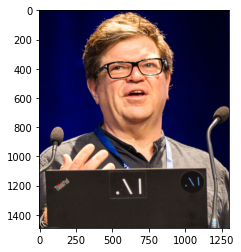

In [ ]:
img = Image.open(image_path)
plt.imshow(img)
plt.show()

In [ ]:
im_height, im_width, im_channels = (600, 500, 3)

image_dataset = ImagePixelCoordsDataset(image_path=image_path, image_height=im_height, image_width=im_width)

dataloader = DataLoader(image_dataset, batch_size=1, pin_memory=True, num_workers=0)
model_siren = SIREN(input_units=3, output_units=1, hidden_units=160, hidden_layer_count=3, outermost_linear=True).to(device)

optimizer = torch.optim.Adam(lr=1e-3, params=model_siren.parameters())

In [ ]:
total_params = np.sum(p.numel() for p in model_siren.parameters())
print(total_params)

78081


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  """Entry point for launching an IPython kernel.


In [ ]:
total_steps = 600
steps_till_summary = 10
prev_loss = 2 ** 8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 0, Total Loss 0.1638767570257187


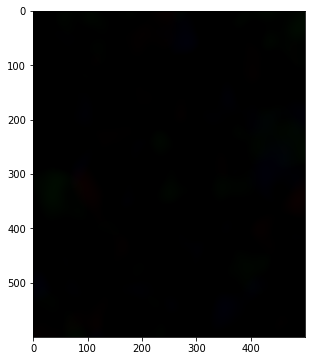

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 10, Total Loss 0.026515772566199303


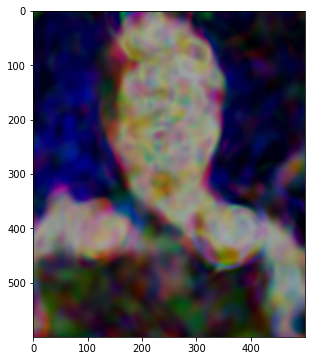

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 20, Total Loss 0.009918787516653538


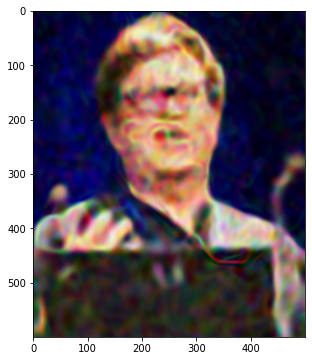

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 30, Total Loss 0.006124899256974459


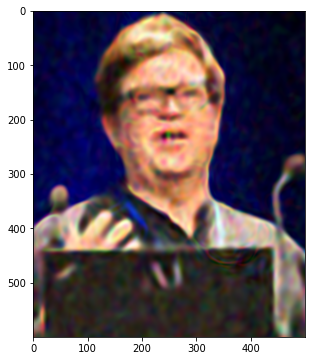

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 40, Total Loss 0.004630195442587137


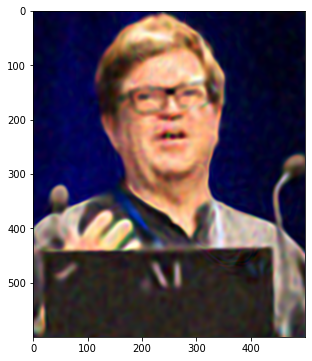

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 50, Total Loss 0.0037654645275324583


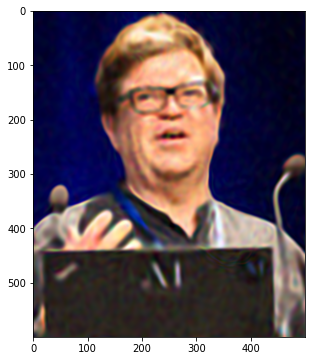

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 60, Total Loss 0.003235334763303399


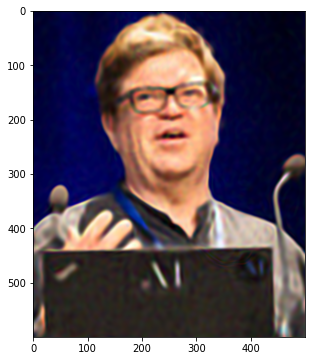

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 70, Total Loss 0.003018765477463603


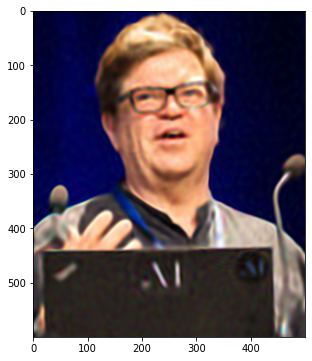

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 80, Total Loss 0.0027562170289456844


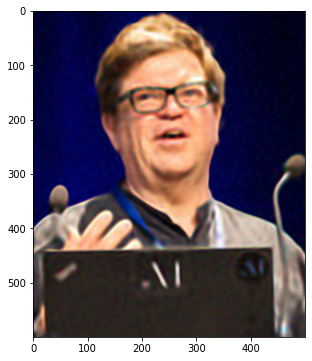

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 90, Total Loss 0.002564669121056795


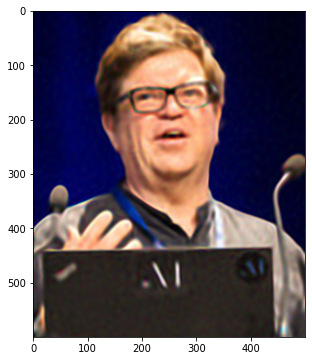

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 100, Total Loss 0.002471023239195347


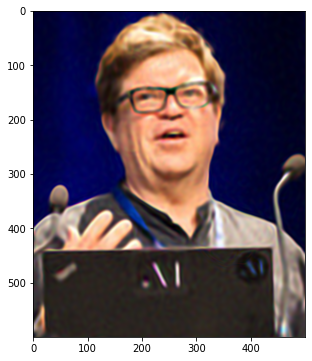

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 110, Total Loss 0.0022897596936672926


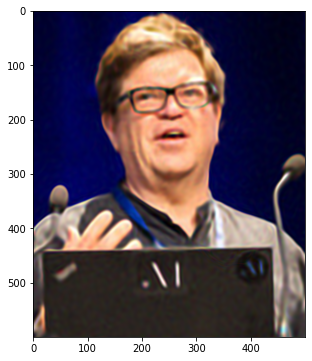

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 120, Total Loss 0.0022398612927645445


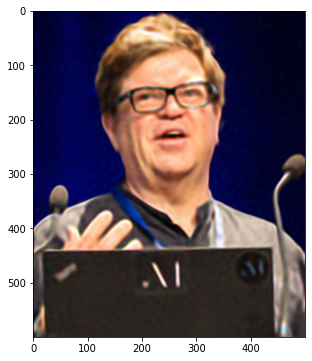

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 130, Total Loss 0.0021707569248974323


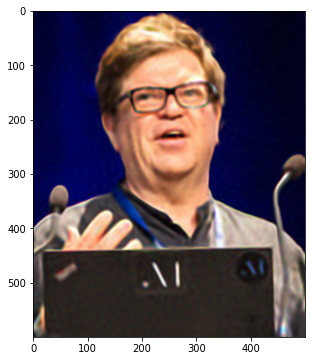

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 140, Total Loss 0.0020670490339398384


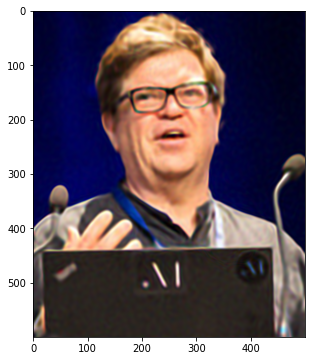

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 150, Total Loss 0.0019249890465289354


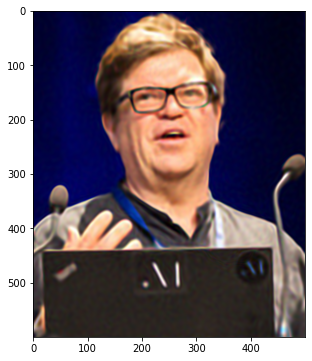

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 160, Total Loss 0.002119692275300622


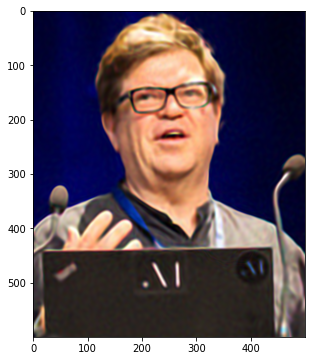

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 170, Total Loss 0.0018608372192829847


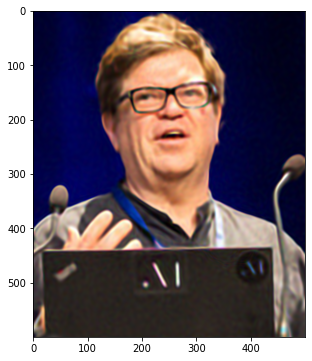

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 180, Total Loss 0.0017410798463970423


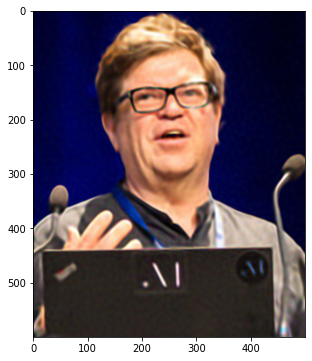

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 190, Total Loss 0.00181794713716954


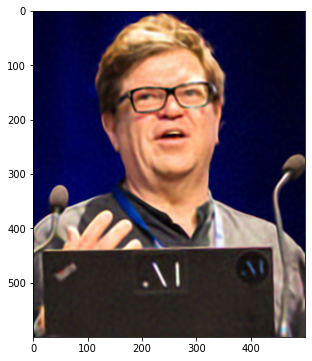

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 200, Total Loss 0.0016666593728587031


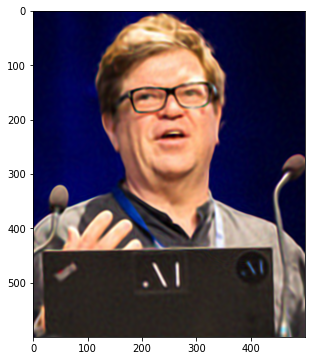

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 210, Total Loss 0.0016856009606271982


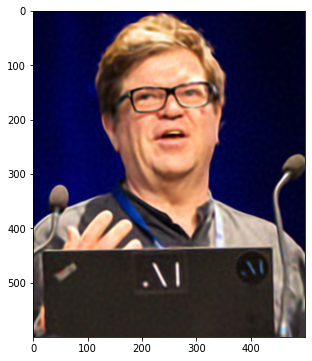

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 220, Total Loss 0.0015772830229252577


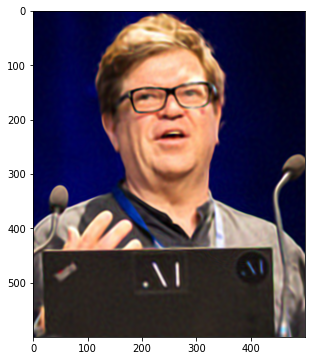

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 230, Total Loss 0.001541550038382411


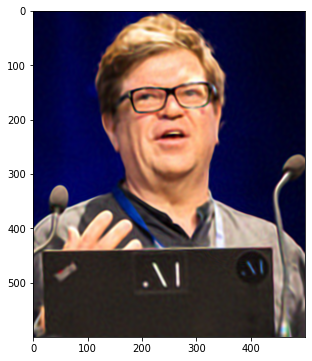

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 240, Total Loss 0.001547648455016315


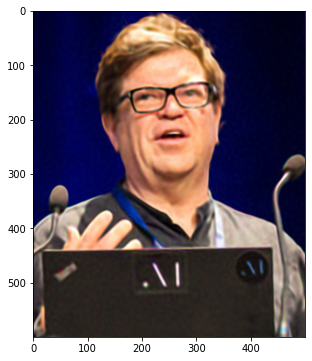

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 250, Total Loss 0.0014991742791607976


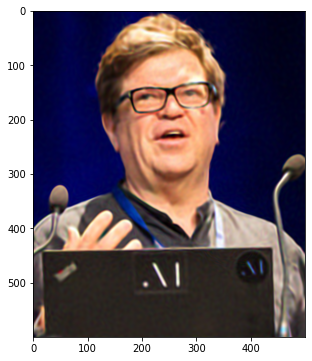

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 260, Total Loss 0.0016240811673924327


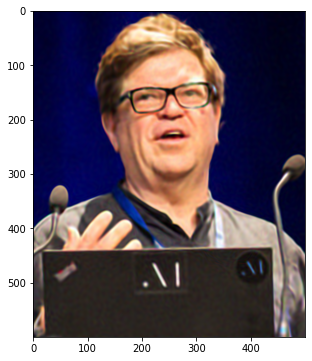

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 270, Total Loss 0.0013707218458876014


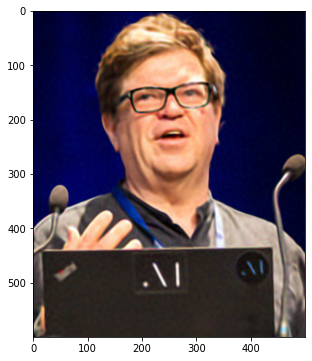

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 280, Total Loss 0.001384027418680489


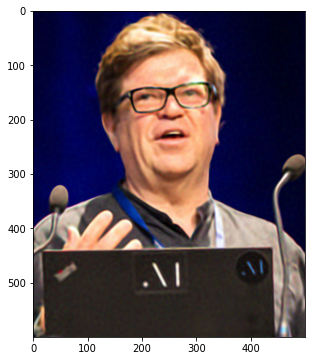

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 290, Total Loss 0.0014001979725435376


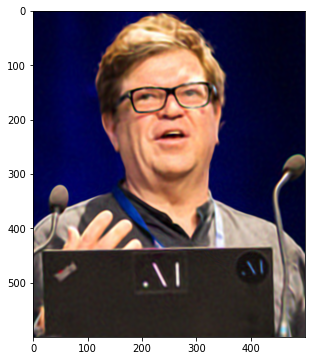

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Step 300, Total Loss 0.0014164994936436415


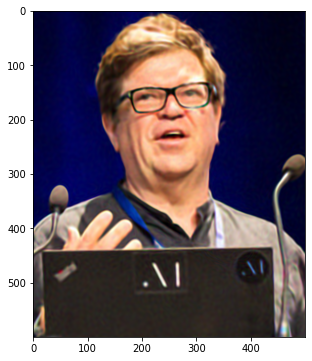

KeyboardInterrupt: ignored

In [ ]:
model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(device), ground_truth.to(device)

for step in range(total_steps):
    model_output, coords = model_siren(model_input)

    loss = ((model_output - ground_truth) ** 2).mean()
    #print(step)

    if not step % steps_till_summary:
        print(F'Step {step}, Total Loss {loss}')

        output_image_numpy_array = model_output.cpu().view(im_height, im_width, im_channels).detach().numpy()

        fig, axs = plt.subplots(1, 1, figsize=(18, 6))
        axs.imshow(output_image_numpy_array)
        plt.show()

        scaled_output_image_numpy_array = np.uint8((output_image_numpy_array - output_image_numpy_array.min()) / (
                    output_image_numpy_array.max() - output_image_numpy_array.min()) * 255)
        im2 = Image.fromarray(scaled_output_image_numpy_array)
        im2.save(os.path.join(out_path, 'img' + str(step) + '.jpg'))

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    with torch.no_grad():
        cur_loss = loss.cpu().detach().numpy()
        if(cur_loss < prev_loss):
            prev_loss = cur_loss
            torch.save(model_siren.state_dict(), save_path)


In [ ]:
import gc
del model_siren
gc.collect()
torch.cuda.empty_cache()

In [ ]:
loaded_model = SIREN(input_units=3, output_units=1, hidden_units=160, hidden_layer_count=3, outermost_linear=True).to(device)
loaded_model.load_state_dict(torch.load('/content/siren_model2.pt'))

<All keys matched successfully>

## Low resolution decoding

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


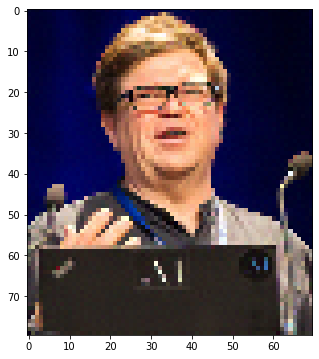

In [ ]:
loaded_model.eval()
with torch.no_grad():

  c_h, c_w, c_c = (80, 70, 3)

  model_input1 = get_mesh_grid(c_h, c_w, c_c)
  model_input1 = model_input1.to(device)

  model_output1, coords1 = loaded_model(model_input1)

  output_image_numpy_array = model_output1.cpu().view(c_h, c_w, c_c).detach().numpy()

  scaled_output_image_numpy_array = np.uint8((output_image_numpy_array - output_image_numpy_array.min()) / (output_image_numpy_array.max() - output_image_numpy_array.min()) * 255)

  #im2 = Image.fromarray(scaled_output_image_numpy_array)
  #im2.save('/content/img2.jpg')

  fig, axes = plt.subplots(1,1, figsize=(18,6))
  axes.imshow(output_image_numpy_array)
  plt.show()

## Decoding in trained resolution

torch.Size([1, 900000, 3]) torch.Size([1, 900000, 1])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.0013, device='cuda:0')


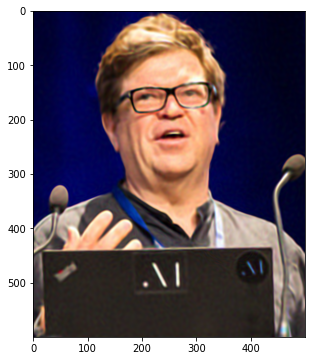

In [ ]:
loaded_model.eval()
with torch.no_grad():

  model_input1, ground_truth1 = next(iter(dataloader))
  print(model_input1.shape, ground_truth1.shape)
  model_input1 = model_input1.cuda()
  ground_truth1 = ground_truth1.cuda()

  c_h, c_w, c_c = (600, 500, 3)

  model_output1, coords1 = loaded_model(model_input1)

  print(((model_output1 - ground_truth1)**2).mean())

  output_image_numpy_array = model_output1.cpu().view(c_h, c_w, c_c).detach().numpy()

  scaled_output_image_numpy_array = np.uint8((output_image_numpy_array - output_image_numpy_array.min()) / (output_image_numpy_array.max() - output_image_numpy_array.min()) * 255)

  #im2 = Image.fromarray(scaled_output_image_numpy_array)
  #im2.save('/content/img2.jpg')

  fig, axes = plt.subplots(1,1, figsize=(18,6))
  axes.imshow(output_image_numpy_array)
  plt.show()

## Animation

In [ ]:
import imageio
import glob
from natsort import natsorted

image_list = glob.glob('output/*.jpg')
print(image_list)
image_list = natsorted(image_list)
image_list = image_list[:16]
print(image_list)

images = []
for im in image_list:
    images.append(imageio.imread(im))
imageio.mimsave('processed.gif', images, fps=4)

['output/img40.jpg', 'output/img220.jpg', 'output/img300.jpg', 'output/img250.jpg', 'output/img230.jpg', 'output/img100.jpg', 'output/img160.jpg', 'output/img50.jpg', 'output/img150.jpg', 'output/img60.jpg', 'output/img120.jpg', 'output/img80.jpg', 'output/img20.jpg', 'output/img180.jpg', 'output/img280.jpg', 'output/img290.jpg', 'output/img110.jpg', 'output/img270.jpg', 'output/img90.jpg', 'output/img0.jpg', 'output/img260.jpg', 'output/img170.jpg', 'output/img140.jpg', 'output/img210.jpg', 'output/img240.jpg', 'output/img70.jpg', 'output/img30.jpg', 'output/img130.jpg', 'output/img190.jpg', 'output/img200.jpg', 'output/img10.jpg']
['output/img0.jpg', 'output/img10.jpg', 'output/img20.jpg', 'output/img30.jpg', 'output/img40.jpg', 'output/img50.jpg', 'output/img60.jpg', 'output/img70.jpg', 'output/img80.jpg', 'output/img90.jpg', 'output/img100.jpg', 'output/img110.jpg', 'output/img120.jpg', 'output/img130.jpg', 'output/img140.jpg', 'output/img150.jpg']


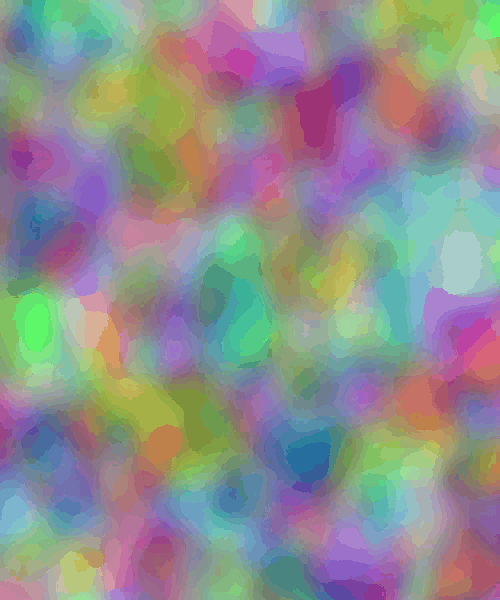

In [ ]:
from IPython.display import Image
Image(open('processed.gif','rb').read())